In [6]:
%cd /media/nicola/Data/Workspace/OSCAR/Oscar/
%pwd

/media/nicola/Data/Workspace/OSCAR/Oscar


'/media/nicola/Data/Workspace/OSCAR/Oscar'

In [7]:
import numpy as np
from extraction.image_retrieval import ImageRetrieval, QueryEncoder
from PIL import Image, ImageDraw, ImageFont
import os
from IPython.display import display

os.environ["CUDA_VISIBLE_DEVICES"]=""

feat_db = '/media/nicola/SSD/VBS_Features/aladin_v3c1_features.h5'
alad_args = '--data_dir /media/nicola/SSD/OSCAR_Datasets/coco_ir --img_feat_file /media/nicola/Data/Workspace/OSCAR/scene_graph_benchmark/output/X152C5_test/inference/vinvl_vg_x152c4/predictions.tsv --eval_model_dir /media/nicola/SSD/OSCAR_Datasets/checkpoint-0132780 --max_seq_length 50 --max_img_seq_length 34 --load_checkpoint /media/nicola/Data/Workspace/OSCAR/Oscar/alad/runs/alad-alignment-and-distill/model_best_rsum.pth.tar'
img_path = '/media/datino/Dataset/VBS/V3C_dataset/V3C1/keyframes_VISIONE'

In [8]:
def render_retrieved_images(img_paths, how_many_imgs=10, height=200, caption=None, similarities=None):
    """
    :param captions_dataset:
    :param images_dataset:
    :param query_caption_id:
    :param sorted_img_indexes:
    :param how_many_imgs:
    :param height:
    :return: a PIL image containing a set of images with the caption printed on the image
    """
    # caption = images_dataset[query_caption_id]
    img_paths = img_paths[:how_many_imgs]
    final_image = []
    separator = np.ones(shape=(height, 5, 3))

    # concatenate all images into a single one
    widths = [0]
    for i, img_path in enumerate(img_paths):
        image = Image.open(img_path).convert('RGB')
        # scale the image
        new_width = int(image.size[0] * height / image.size[1])
        image = image.resize((new_width, height), Image.ANTIALIAS)
        image = np.array(image)
        if i == 0:
            final_image = image
            final_image = np.concatenate((final_image, separator), axis=1)
        else:
            final_image = np.concatenate((final_image, image, separator), axis=1)
        widths.append(final_image.shape[1])

    # write the img_id onto the image
    final_image = Image.fromarray(final_image.astype(np.uint8))
    draw = ImageDraw.Draw(final_image)
    fnt = ImageFont.truetype('Pillow/Tests/fonts/FreeMono.ttf', 16)
    for i in range(len(widths) - 1):
        imgid = os.path.split(img_paths[i])[1]
        imgid = os.path.splitext(imgid)[0]
        if similarities is not None:
            imgid += ' score={:.2f}'.format(similarities[i])
        x, y = (widths[i], 10)
        w, h = fnt.getsize(imgid)
        draw.rectangle((x, y, x + w, y + h), fill='black')
        draw.text((x, y), imgid, font=fnt, fill=(255, 255, 0))
    return final_image
        
def img_ids_to_paths(img_path, img_ids):
    subfolders = [fid.split('_')[0] for fid in img_ids]
    out_paths = [os.path.join(img_path, sf, '{}.jpg'.format(img_id)) for sf, img_id in zip(subfolders, img_ids)]
    return out_paths

# # TEST
# img_ids = ['shot04805_81_RKF', 'shot04226_22_RKF', 'shot04805_82_RKF', 'shot01561_220_RKF', 'shot01561_216_RKF', 'shot04773_39_RKF', 'shot02127_17_RKF', 'shot05236_223_RKF', 'shot05236_220_RKF', 'shot04144_62_RKF', 'shot07415_135_RKF', 'shot03575_412_RKF']
# img_paths = img_ids_to_paths(img_path, img_ids)
# final_image = render_retrieved_images(img_paths)
# display(final_image)

In [9]:
# Initialize image retrieval module
ir = ImageRetrieval(feat_db)
query_encoder = QueryEncoder(alad_args)

Namespace(adam_epsilon=1e-08, add_od_labels=False, att_mask_type='CLR', config=None, config_name='', cross_image_eval=False, data_dir='/media/nicola/SSD/OSCAR_Datasets/coco_ir', do_eval=False, do_lower_case=False, do_test=False, do_train=False, drop_out=0.1, eval_caption_index_file='', eval_img_keys_file='', eval_model_dir='/media/nicola/SSD/OSCAR_Datasets/checkpoint-0132780', evaluate_during_training=False, features_h5='alad_features.h5', gradient_accumulation_steps=1, img_feat_file='/media/nicola/Data/Workspace/OSCAR/scene_graph_benchmark/output/X152C5_test/inference/vinvl_vg_x152c4/predictions.tsv', img_feature_dim=2054, img_feature_type='frcnn', img_layer_norm_eps=1e-12, learning_rate=2e-05, load_checkpoint='/media/nicola/Data/Workspace/OSCAR/Oscar/alad/runs/alad-alignment-and-distill/model_best_rsum.pth.tar', logging_steps=20, loss_type='sfmx', max_grad_norm=1.0, max_img_seq_length=34, max_seq_length=50, max_steps=-1, model_name_or_path=None, no_cuda=False, num_captions_per_img_tr

2022-11-25 12:27:38,273 Override do_lower_case with train args: False -> True


2022-11-25 12:27:38,275 vlpretrain WARNING: Override add_od_labels with train args: False -> True


2022-11-25 12:27:38,275 Override add_od_labels with train args: False -> True


2022-11-25 12:27:38,276 vlpretrain INFO: Evaluate the following checkpoint: /media/nicola/SSD/OSCAR_Datasets/checkpoint-0132780


2022-11-25 12:27:38,276 Evaluate the following checkpoint: /media/nicola/SSD/OSCAR_Datasets/checkpoint-0132780
2022-11-25 12:27:38,278 Model name '/media/nicola/SSD/OSCAR_Datasets/checkpoint-0132780' not found in model shortcut name list (bert-base-uncased, bert-large-uncased, bert-base-cased, bert-large-cased, bert-base-multilingual-uncased, bert-base-multilingual-cased, bert-base-chinese, bert-base-german-cased, bert-large-uncased-whole-word-masking, bert-large-cased-whole-word-masking, bert-large-uncased-whole-word-masking-finetuned-squad, bert-large-cased-whole-word-masking-finetuned-squad, bert-base-cased-finetuned-mrpc). Assuming '/media/nicola/SSD/OSCAR_Datasets/checkpoint-0132780' is a path or url to a directory containing tokenizer files.
2022-11-25 12:27:38,281 loading file /media/nicola/SSD/OSCAR_Datasets/checkpoint-0132780/added_tokens.json
2022-11-25 12:27:38,282 loading file /media/nicola/SSD/OSCAR_Datasets/checkpoint-0132780/special_tokens_map.json
2022-11-25 12:27:38,28

2022-11-25 12:27:40,449 vlpretrain WARNING: Device: cpu, n_gpu: 0


2022-11-25 12:27:40,449 Device: cpu, n_gpu: 0


2022-11-25 12:27:40,451 vlpretrain INFO: output_mode: classification, #Labels: 2


2022-11-25 12:27:40,451 output_mode: classification, #Labels: 2


2022-11-25 12:27:40,452 vlpretrain INFO: Training/evaluation parameters Namespace(adam_epsilon=1e-08, add_od_labels=True, att_mask_type='CLR', config=None, config_name='', cross_image_eval=False, data_dir='/media/nicola/SSD/OSCAR_Datasets/coco_ir', device=device(type='cpu'), do_eval=True, do_lower_case=True, do_test=True, do_train=False, drop_out=0.1, eval_caption_index_file='', eval_img_keys_file='', eval_model_dir='/media/nicola/SSD/OSCAR_Datasets/checkpoint-0132780', evaluate_during_training=False, features_h5='alad_features.h5', gradient_accumulation_steps=1, img_feat_file='/media/nicola/Data/Workspace/OSCAR/scene_graph_benchmark/output/X152C5_test/inference/vinvl_vg_x152c4/predictions.tsv', img_feature_dim=2054, img_feature_type='frcnn', img_layer_norm_eps=1e-12, learning_rate=2e-05, load_checkpoint='/media/nicola/Data/Workspace/OSCAR/Oscar/alad/runs/alad-alignment-and-distill/model_best_rsum.pth.tar', logging_steps=20, loss_type='sfmx', max_grad_norm=1.0, max_img_seq_length=34, m

2022-11-25 12:27:40,452 Training/evaluation parameters Namespace(adam_epsilon=1e-08, add_od_labels=True, att_mask_type='CLR', config=None, config_name='', cross_image_eval=False, data_dir='/media/nicola/SSD/OSCAR_Datasets/coco_ir', device=device(type='cpu'), do_eval=True, do_lower_case=True, do_test=True, do_train=False, drop_out=0.1, eval_caption_index_file='', eval_img_keys_file='', eval_model_dir='/media/nicola/SSD/OSCAR_Datasets/checkpoint-0132780', evaluate_during_training=False, features_h5='alad_features.h5', gradient_accumulation_steps=1, img_feat_file='/media/nicola/Data/Workspace/OSCAR/scene_graph_benchmark/output/X152C5_test/inference/vinvl_vg_x152c4/predictions.tsv', img_feature_dim=2054, img_feature_type='frcnn', img_layer_norm_eps=1e-12, learning_rate=2e-05, load_checkpoint='/media/nicola/Data/Workspace/OSCAR/Oscar/alad/runs/alad-alignment-and-distill/model_best_rsum.pth.tar', logging_steps=20, loss_type='sfmx', max_grad_norm=1.0, max_img_seq_length=34, max_seq_length=50,

Model checkpoint loaded!


Computing similarities...
[########################################] | 100% Completed |  1.1s


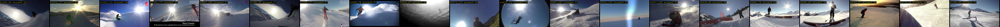

In [10]:
# Query 1, NO SQ
query = "A man is skiing and is going against the sun"
query_feat = query_encoder.get_text_embedding(query)
img_ids, similarities, _ = ir.sequential_search(query_feat, enable_scalar_quantization=False)
img_paths = img_ids_to_paths(img_path, img_ids)
final_image = render_retrieved_images(img_paths, similarities=similarities, how_many_imgs=20)
display(final_image)

Using scalar quantization
Number of non-zero elements in query: 273
Max query vector value: 0.12934942543506622
Computing similarities...
[########################################] | 100% Completed | 20.0s
Non zero elems: 273


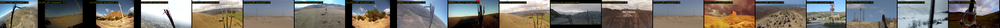

In [12]:
# Query 1, SQ factor=0, threshold=30
query = "Some telephone pole in the middle of the desert"

query_feat = query_encoder.get_text_embedding(query)
img_ids, similarities, nzelems = ir.sequential_search(query_feat, enable_scalar_quantization=True, factor=0, thr=30)
print(f"Non zero elems: {nzelems}")
img_paths = img_ids_to_paths(img_path, img_ids)
final_image = render_retrieved_images(img_paths, similarities=similarities, how_many_imgs=20)
display(final_image)

Using scalar quantization
Number of non-zero elements in query: 388
Max query vector value: 0.12139157950878143
Computing similarities...
[########################################] | 100% Completed | 23.6s
Non zero elems: 388


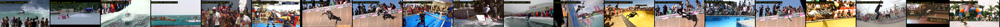

In [8]:
# Query 1, SQ factor=0, threshold=40
query = "A man in wetsuit surfing in front of a big crowd"

query_feat = query_encoder.get_text_embedding(query)
img_ids, similarities, nzelems = ir.sequential_search(query_feat, enable_scalar_quantization=True, factor=0, thr=40)
print(f"Non zero elems: {nzelems}")
img_paths = img_ids_to_paths(img_path, img_ids)
final_image = render_retrieved_images(img_paths, similarities=similarities, how_many_imgs=20)
display(final_image)

Using scalar quantization
Number of non-zero elements in query: 124
Max query vector value: 0.12139157950878143
Computing similarities...
[########################################] | 100% Completed | 22.0s
Non zero elems: 124


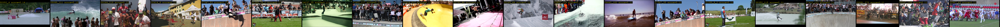

In [9]:
# Query 1, SQ factor=0, threshold=20
query = "A man in wetsuit surfing in front of a big crowd"

query_feat = query_encoder.get_text_embedding(query)
img_ids, similarities, nzelems = ir.sequential_search(query_feat, enable_scalar_quantization=True, factor=0, thr=20)
print(f"Non zero elems: {nzelems}")
img_paths = img_ids_to_paths(img_path, img_ids)
final_image = render_retrieved_images(img_paths, similarities=similarities, how_many_imgs=20)
display(final_image)

Using scalar quantization
Number of non-zero elements in query: 503
Max query vector value: 0.12139157950878143
Computing similarities...
[########################################] | 100% Completed | 22.0s
Non zero elems: 503


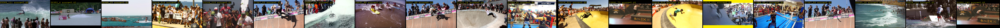

In [10]:
# Query 1, SQ factor=0, threshold=60
query = "A man in wetsuit surfing in front of a big crowd"

query_feat = query_encoder.get_text_embedding(query)
img_ids, similarities, nzelems = ir.sequential_search(query_feat, enable_scalar_quantization=True, factor=0, thr=60)
print(f"Non zero elems: {nzelems}")
img_paths = img_ids_to_paths(img_path, img_ids)
final_image = render_retrieved_images(img_paths, similarities=similarities, how_many_imgs=20)
display(final_image)

Using scalar quantization
Number of non-zero elements in query: 607
Max query vector value: 0.12139157950878143
Computing similarities...
[########################################] | 100% Completed | 21.4s
Non zero elems: 607


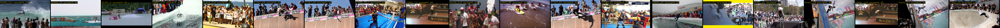

In [11]:
# Query 1, SQ factor=0, threshold=100
query = "A man in wetsuit surfing in front of a big crowd"

query_feat = query_encoder.get_text_embedding(query)
img_ids, similarities, nzelems = ir.sequential_search(query_feat, enable_scalar_quantization=True, factor=0, thr=100)
print(f"Non zero elems: {nzelems}")
img_paths = img_ids_to_paths(img_path, img_ids)
final_image = render_retrieved_images(img_paths, similarities=similarities, how_many_imgs=20)
display(final_image)

In [15]:
# Query 1, SQ factor=0, threshold=150
query = "A man in wetsuit surfing in front of a big crowd"

query_feat = query_encoder.get_text_embedding(query)
img_ids, similarities, nzelems = ir.sequential_search(query_feat, enable_scalar_quantization=True, factor=0, thr=1000000)
print(f"Non zero elems: {nzelems}")
img_paths = img_ids_to_paths(img_path, img_ids)
final_image = render_retrieved_images(img_paths, similarities=similarities, how_many_imgs=20)
display(final_image)

Using scalar quantization
Number of non-zero elements in query: 768
Max query vector value: 0.12139157950878143
Computing similarities...
[##                                      ] | 6% Completed |  4.6s


KeyboardInterrupt: 

In [ ]:
# Query 4
query = "A yellow object near a person"

img_ids, similarities = ir.sequential_search(query)
img_paths = img_ids_to_paths(img_path, img_ids)
final_image = render_retrieved_images(img_paths, similarities=similarities, how_many_imgs=20)
display(final_image)

In [ ]:
# Query 5
query = "A band playing in a pub with drunk people in the crowd"

img_ids, similarities = ir.sequential_search(query)
img_paths = img_ids_to_paths(img_path, img_ids)
final_image = render_retrieved_images(img_paths, similarities=similarities, how_many_imgs=20)
display(final_image)

In [ ]:
# Query 6
query = "Kids are playing in the pool"

img_ids, similarities = ir.sequential_search(query)
img_paths = img_ids_to_paths(img_path, img_ids)
final_image = render_retrieved_images(img_paths, similarities=similarities, how_many_imgs=20)
display(final_image)

In [ ]:
# Query 7
query = "A woman on the right of her dog"

img_ids, similarities = ir.sequential_search(query)
img_paths = img_ids_to_paths(img_path, img_ids)
final_image = render_retrieved_images(img_paths, similarities=similarities, how_many_imgs=20)
display(final_image)

In [ ]:
# Query 8
query = "There is a kid with a blue shirt running in the street"

img_ids, similarities = ir.sequential_search(query)
img_paths = img_ids_to_paths(img_path, img_ids)
final_image = render_retrieved_images(img_paths, similarities=similarities, how_many_imgs=20)
display(final_image)